# MLN Severity Segmentation Visualization

This notebook visualizes the HSV-based color segmentation used for MLN severity classification.

## Prerequisites
Activate the conda environment before running:
```bash
conda activate ikigori_mln
jupyter notebook
```

## Purpose
- Validate HSV color ranges for green, yellow, and brown tissue
- Inspect segmentation quality across different severity levels
- Verify threshold effectiveness for classification
- Compare v1 (original) and v2 (updated) labeling results

## Workflow
1. Import libraries and initialize labeler
2. Load and compare v1 and v2 results
3. Visualize samples from both versions
4. Analyze distribution improvements

## 1. Setup and Imports

In [2]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import json
from pathlib import Path
import sys
import os

# Add scripts directory to path
scripts_path = os.path.abspath('../scripts/Phase1_labeling')
if scripts_path not in sys.path:
    sys.path.append(scripts_path)

from mln_severity_labeler import MLNSeverityLabeler

# Configure matplotlib for inline display
%matplotlib inline
plt.rcParams['figure.figsize'] = (15, 10)
plt.rcParams['figure.dpi'] = 100

print("Libraries imported successfully")
print(f"OpenCV version: {cv2.__version__}")
print(f"NumPy version: {np.__version__}")
print(f"Working directory: {os.getcwd()}")

Libraries imported successfully
OpenCV version: 4.12.0
NumPy version: 2.2.6
Working directory: /Users/kabisa_03/Documents/capstone/IkigoriSmart/notebooks


## 2. Load V1 Results (Original Thresholds)

In [3]:
# Load V1 labeling results
results_v1_path = '../scripts/Phase1_labeling/mln_severity_labels.json'

if Path(results_v1_path).exists():
    with open(results_v1_path, 'r') as f:
        results_v1 = json.load(f)
    
    print(f"V1: Loaded {len(results_v1)} labeled images")
    
    # Group by severity
    severity_groups_v1 = {'Early': [], 'Moderate': [], 'Severe': []}
    for result in results_v1:
        severity = result['severity']
        if severity in severity_groups_v1:
            severity_groups_v1[severity].append(result)
    
    print("\nV1 Distribution:")
    for severity, images in severity_groups_v1.items():
        pct = (len(images) / len(results_v1)) * 100
        print(f"  {severity}: {len(images)} ({pct:.1f}%)")
else:
    print(f"V1 results not found at {results_v1_path}")
    results_v1 = None

V1: Loaded 3231 labeled images

V1 Distribution:
  Early: 2091 (64.7%)
  Moderate: 726 (22.5%)
  Severe: 414 (12.8%)


## 3. Load V2 Results (Updated Thresholds + CLAHE)

In [4]:
# Load V2 labeling results
results_v2_path = '../scripts/Phase1_labeling/mln_severity_labels_v2.json'

if Path(results_v2_path).exists():
    with open(results_v2_path, 'r') as f:
        results_v2 = json.load(f)
    
    print(f"V2: Loaded {len(results_v2)} labeled images")
    
    # Group by severity
    severity_groups_v2 = {'Early': [], 'Moderate': [], 'Severe': []}
    for result in results_v2:
        severity = result['severity']
        if severity in severity_groups_v2:
            severity_groups_v2[severity].append(result)
    
    print("\nV2 Distribution:")
    for severity, images in severity_groups_v2.items():
        pct = (len(images) / len(results_v2)) * 100
        print(f"  {severity}: {len(images)} ({pct:.1f}%)")
else:
    print(f"V2 results not found at {results_v2_path}")
    print("Run the updated mln_severity_labeler.py script to generate V2 labels.")
    results_v2 = None

V2: Loaded 3231 labeled images

V2 Distribution:
  Early: 1401 (43.4%)
  Moderate: 992 (30.7%)
  Severe: 838 (25.9%)


## 4. Compare V1 vs V2 Distributions

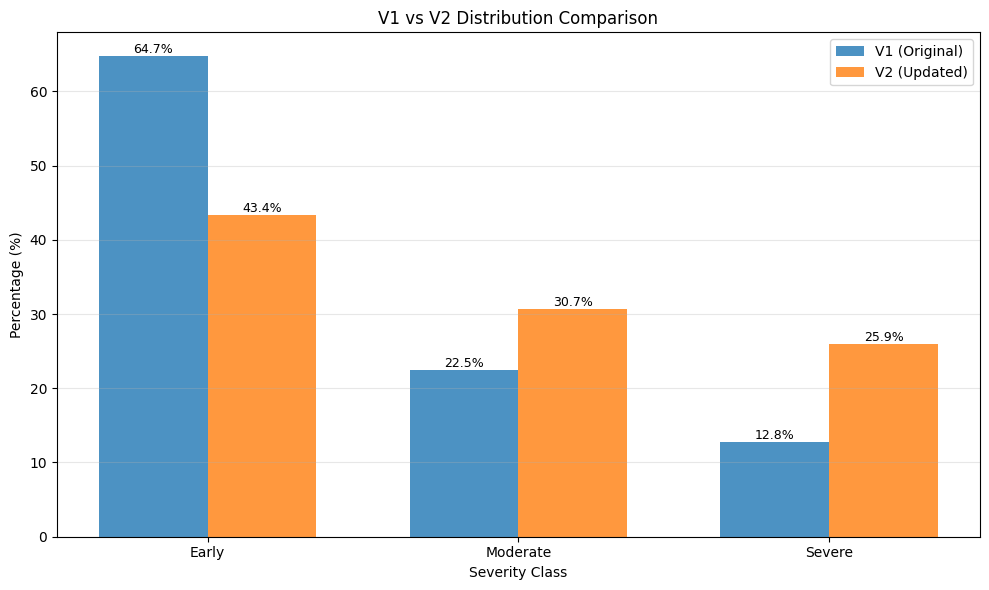


Distribution Changes:
Early: 64.7% → 43.4% (-21.4%)
Moderate: 22.5% → 30.7% (+8.2%)
Severe: 12.8% → 25.9% (+13.1%)


In [5]:
if results_v1 and results_v2:
    # Create comparison bar chart
    fig, ax = plt.subplots(1, 1, figsize=(10, 6))
    
    severities = ['Early', 'Moderate', 'Severe']
    v1_counts = [len(severity_groups_v1[s]) for s in severities]
    v2_counts = [len(severity_groups_v2[s]) for s in severities]
    
    v1_pcts = [(c / len(results_v1)) * 100 for c in v1_counts]
    v2_pcts = [(c / len(results_v2)) * 100 for c in v2_counts]
    
    x = np.arange(len(severities))
    width = 0.35
    
    bars1 = ax.bar(x - width/2, v1_pcts, width, label='V1 (Original)', alpha=0.8)
    bars2 = ax.bar(x + width/2, v2_pcts, width, label='V2 (Updated)', alpha=0.8)
    
    ax.set_xlabel('Severity Class')
    ax.set_ylabel('Percentage (%)')
    ax.set_title('V1 vs V2 Distribution Comparison')
    ax.set_xticks(x)
    ax.set_xticklabels(severities)
    ax.legend()
    ax.grid(axis='y', alpha=0.3)
    
    # Add value labels on bars
    for bars in [bars1, bars2]:
        for bar in bars:
            height = bar.get_height()
            ax.text(bar.get_x() + bar.get_width()/2., height,
                   f'{height:.1f}%', ha='center', va='bottom', fontsize=9)
    
    plt.tight_layout()
    plt.show()
    
    print("\nDistribution Changes:")
    for i, severity in enumerate(severities):
        change = v2_pcts[i] - v1_pcts[i]
        print(f"{severity}: {v1_pcts[i]:.1f}% → {v2_pcts[i]:.1f}% ({change:+.1f}%)")
else:
    print("Cannot compare - one or both result sets missing")

## 5. Initialize Labelers for Visualization

In [6]:
# Initialize both labelers
labeler_v1 = MLNSeverityLabeler(use_clahe=False)  # Original settings
labeler_v2 = MLNSeverityLabeler(use_clahe=True)   # Updated settings

# Restore V1 settings manually
labeler_v1.green_lower = np.array([35, 40, 40])
labeler_v1.yellow_lower = np.array([20, 40, 100])
labeler_v1.brown_lower = np.array([10, 40, 20])
labeler_v1.brown_upper = np.array([20, 200, 150])
labeler_v1.early_affected_max = 0.15
labeler_v1.moderate_affected_max = 0.40
labeler_v1.severe_affected_min = 0.40

print("V1 Labeler (Original): No CLAHE, original HSV ranges")
print("V2 Labeler (Updated): CLAHE enabled, expanded HSV ranges")

V1 Labeler (Original): No CLAHE, original HSV ranges
V2 Labeler (Updated): CLAHE enabled, expanded HSV ranges


## 6. Define Visualization Function

In [7]:
def visualize_segmentation(image_path, labeler, show_metrics=True, title_prefix=""):
    """
    Visualize HSV segmentation for a single image.
    """
    img = cv2.imread(image_path)
    if img is None:
        print(f"Cannot read image: {image_path}")
        return
    
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    
    # Create masks
    green_mask = cv2.inRange(hsv, labeler.green_lower, labeler.green_upper)
    yellow_mask = cv2.inRange(hsv, labeler.yellow_lower, labeler.yellow_upper)
    brown_mask = cv2.inRange(hsv, labeler.brown_lower, labeler.brown_upper)
    
    # Get metrics
    result = labeler.process_image(image_path)
    metrics = result['metrics']
    severity = result['severity']
    
    # Create figure
    fig, axes = plt.subplots(2, 3, figsize=(15, 10))
    
    if show_metrics:
        fig.suptitle(
            f"{title_prefix}Severity: {severity} | Affected: {metrics['affected_percentage']:.1%} | "
            f"Necrosis Ratio: {metrics['necrosis_ratio']:.1%}",
            fontsize=14, fontweight='bold'
        )
    
    axes[0, 0].imshow(img_rgb)
    axes[0, 0].set_title('Original Image')
    axes[0, 0].axis('off')
    
    axes[0, 1].imshow(green_mask, cmap='Greens')
    axes[0, 1].set_title(f'Green: {metrics["green_pixels"]:,} px')
    axes[0, 1].axis('off')
    
    axes[0, 2].imshow(yellow_mask, cmap='YlOrBr')
    axes[0, 2].set_title(f'Yellow: {metrics["yellow_pixels"]:,} px')
    axes[0, 2].axis('off')
    
    axes[1, 0].imshow(brown_mask, cmap='copper')
    axes[1, 0].set_title(f'Brown: {metrics["brown_pixels"]:,} px')
    axes[1, 0].axis('off')
    
    combined = np.zeros_like(img_rgb)
    combined[green_mask > 0] = [0, 255, 0]
    combined[yellow_mask > 0] = [255, 255, 0]
    combined[brown_mask > 0] = [139, 69, 19]
    
    axes[1, 1].imshow(combined)
    axes[1, 1].set_title('Combined Segmentation')
    axes[1, 1].axis('off')
    
    overlay = img_rgb.copy().astype(float)
    overlay[green_mask > 0] = overlay[green_mask > 0] * 0.7 + np.array([0, 255, 0]) * 0.3
    overlay[yellow_mask > 0] = overlay[yellow_mask > 0] * 0.7 + np.array([255, 255, 0]) * 0.3
    overlay[brown_mask > 0] = overlay[brown_mask > 0] * 0.7 + np.array([139, 69, 19]) * 0.3
    
    axes[1, 2].imshow(overlay.astype(np.uint8))
    axes[1, 2].set_title('Overlay')
    axes[1, 2].axis('off')
    
    plt.tight_layout()
    plt.show()
    
    return metrics, severity

print("Visualization function defined")

Visualization function defined


## 7. Compare V1 vs V2 on Same Images

Comparing V1 vs V2 on: MLN_2165.JPEG

V1 (Original Thresholds)


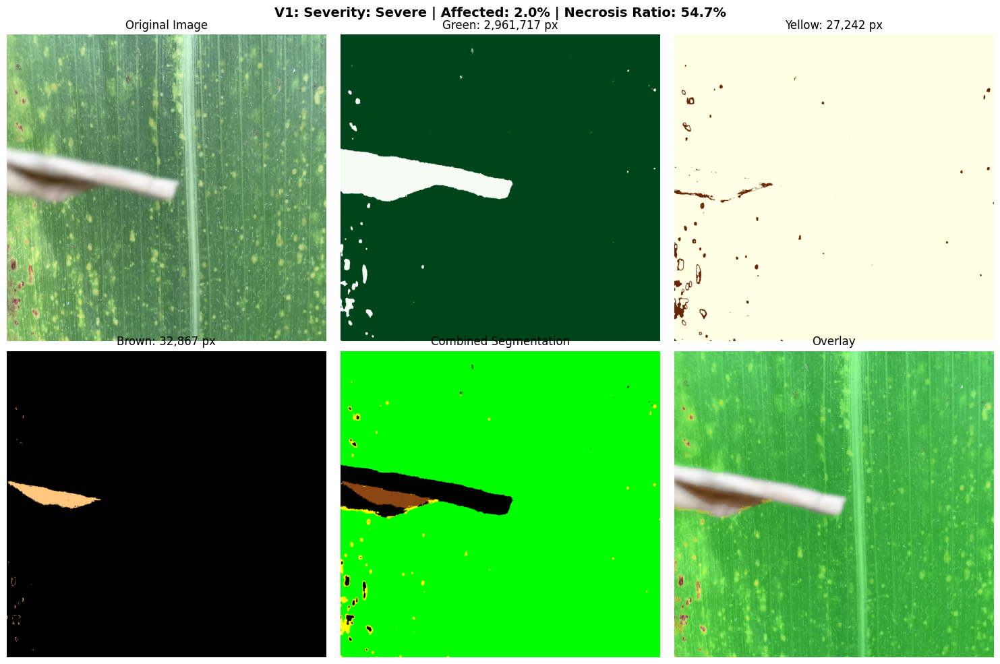


V2 (Updated Thresholds + CLAHE)


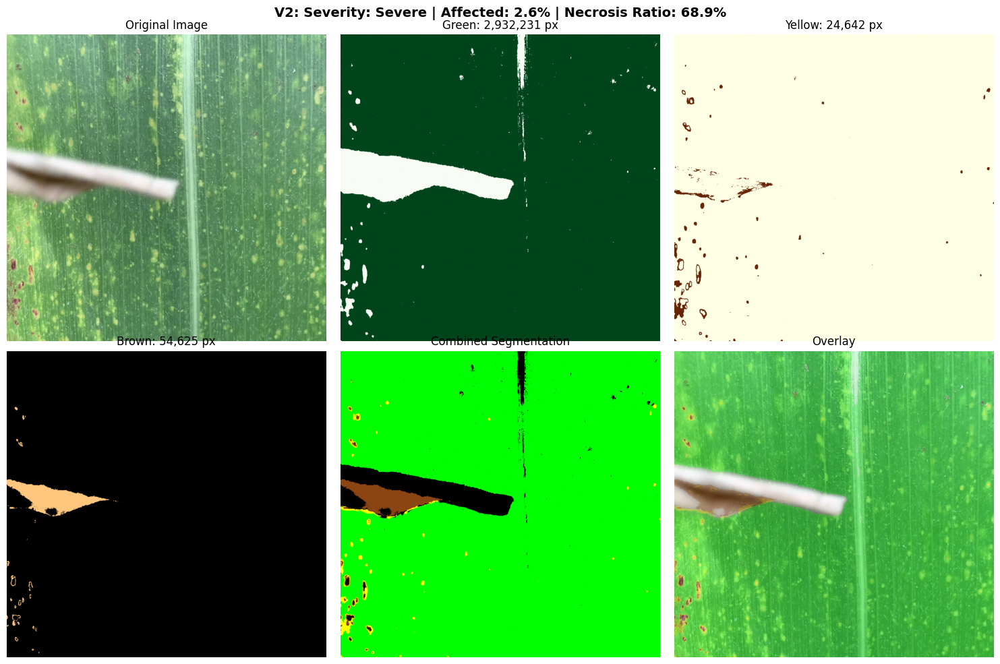


Comparison Summary
V1 Classification: Severe
V2 Classification: Severe

Affected Area: 2.0% → 2.6%
Necrosis Ratio: 54.7% → 68.9%


In [8]:
# Select a sample image to compare
if results_v1:
    sample_image = results_v1[100]['image_path']
    
    print(f"Comparing V1 vs V2 on: {Path(sample_image).name}\n")
    
    print("=" * 80)
    print("V1 (Original Thresholds)")
    print("=" * 80)
    metrics_v1, severity_v1 = visualize_segmentation(sample_image, labeler_v1, title_prefix="V1: ")
    
    print("\n" + "=" * 80)
    print("V2 (Updated Thresholds + CLAHE)")
    print("=" * 80)
    metrics_v2, severity_v2 = visualize_segmentation(sample_image, labeler_v2, title_prefix="V2: ")
    
    print("\n" + "=" * 80)
    print("Comparison Summary")
    print("=" * 80)
    print(f"V1 Classification: {severity_v1}")
    print(f"V2 Classification: {severity_v2}")
    print(f"\nAffected Area: {metrics_v1['affected_percentage']:.1%} → {metrics_v2['affected_percentage']:.1%}")
    print(f"Necrosis Ratio: {metrics_v1['necrosis_ratio']:.1%} → {metrics_v2['necrosis_ratio']:.1%}")
else:
    print("V1 results not available for comparison")

Comparing EARLY classification on: MLN_2196.JPEG

V1 (Original) - EARLY


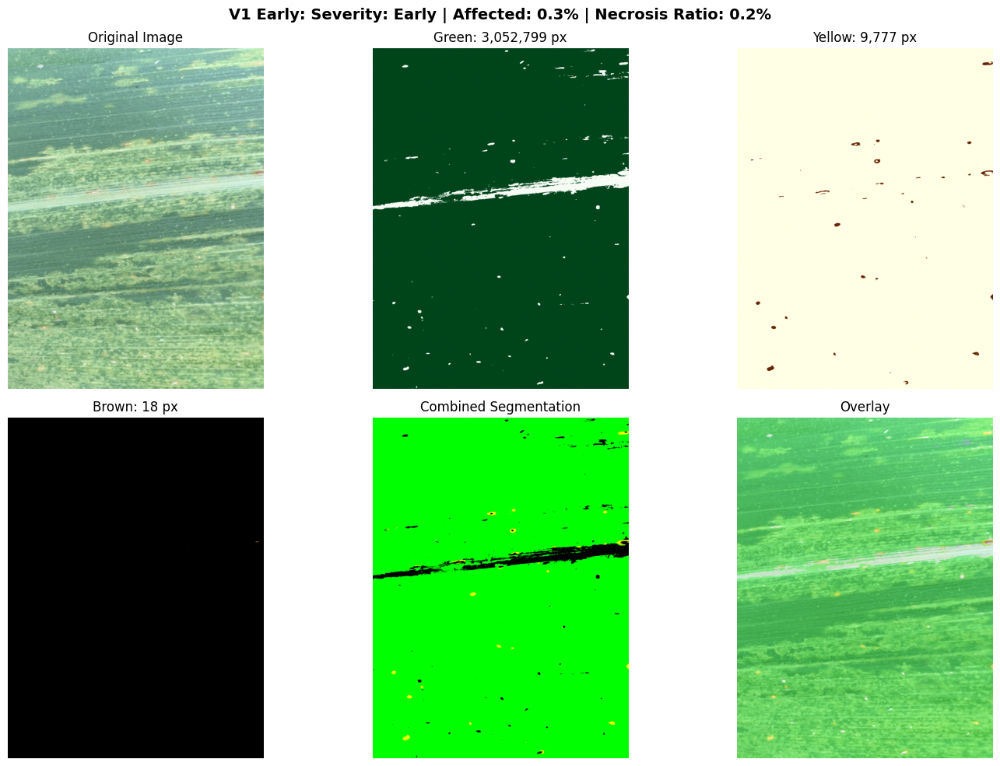


V2 (Updated) - EARLY


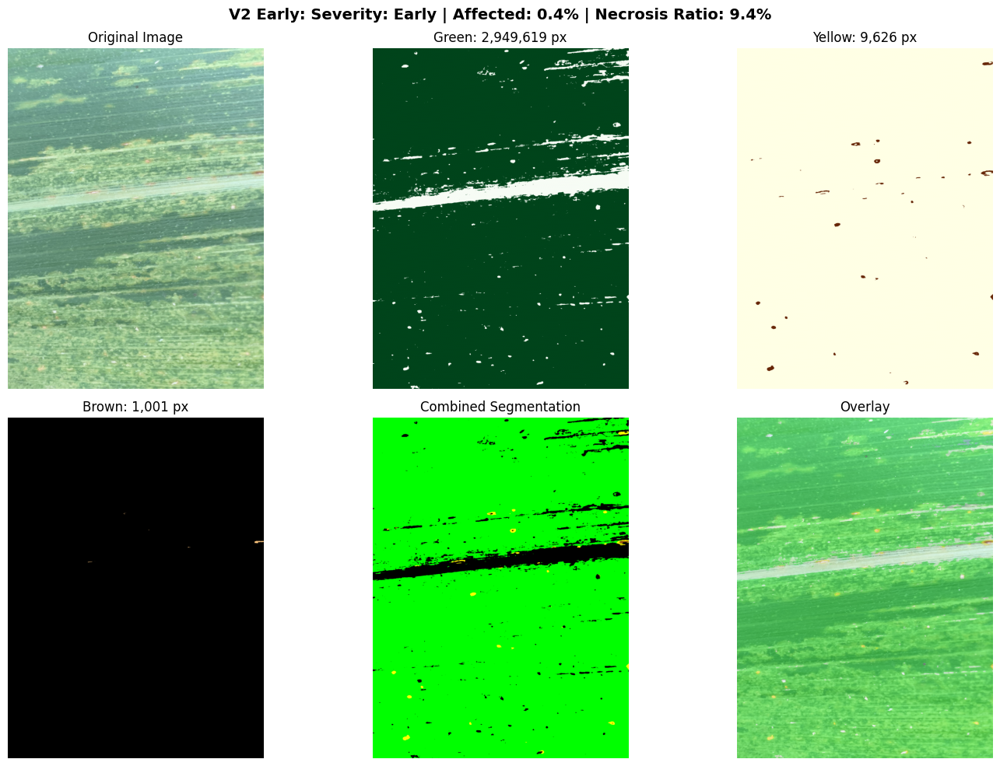


EARLY Comparison Summary
V1 Classification: Early
V2 Classification: Early

Affected Area: 0.3% → 0.4%
Necrosis Ratio: 0.2% → 9.4%


In [11]:
## 7A. Compare Early Severity: V1 vs V2

# Find an Early image that exists in both V1 and V2
early_v1_paths = [r['image_path'] for r in severity_groups_v1['Early']]
early_v2_paths = [r['image_path'] for r in severity_groups_v2['Early']]
common_early = list(set(early_v1_paths) & set(early_v2_paths))

if common_early:
    sample_early = common_early[50]  # Pick a sample
    
    print(f"Comparing EARLY classification on: {Path(sample_early).name}\n")
    
    print("=" * 80)
    print("V1 (Original) - EARLY")
    print("=" * 80)
    metrics_v1_early, severity_v1_early = visualize_segmentation(sample_early, labeler_v1, title_prefix="V1 Early: ")
    
    print("\n" + "=" * 80)
    print("V2 (Updated) - EARLY")
    print("=" * 80)
    metrics_v2_early, severity_v2_early = visualize_segmentation(sample_early, labeler_v2, title_prefix="V2 Early: ")
    
    print("\n" + "=" * 80)
    print("EARLY Comparison Summary")
    print("=" * 80)
    print(f"V1 Classification: {severity_v1_early}")
    print(f"V2 Classification: {severity_v2_early}")
    print(f"\nAffected Area: {metrics_v1_early['affected_percentage']:.1%} → {metrics_v2_early['affected_percentage']:.1%}")
    print(f"Necrosis Ratio: {metrics_v1_early['necrosis_ratio']:.1%} → {metrics_v2_early['necrosis_ratio']:.1%}")


Comparing MODERATE classification on: MLN_1697.JPEG

V1 (Original) - MODERATE


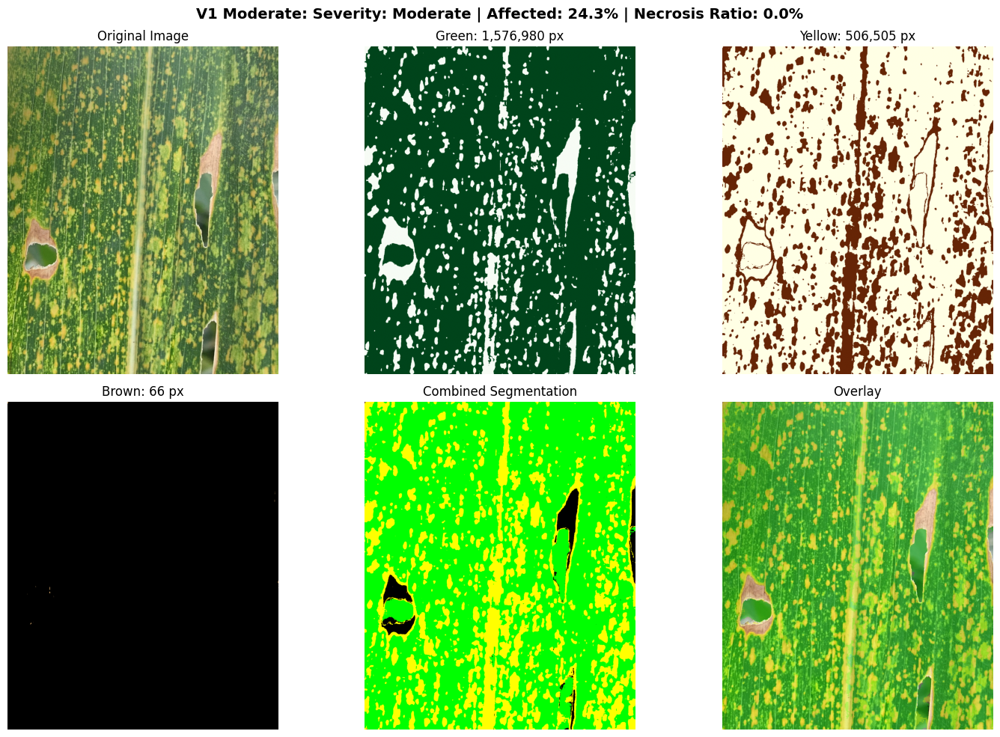


V2 (Updated) - MODERATE


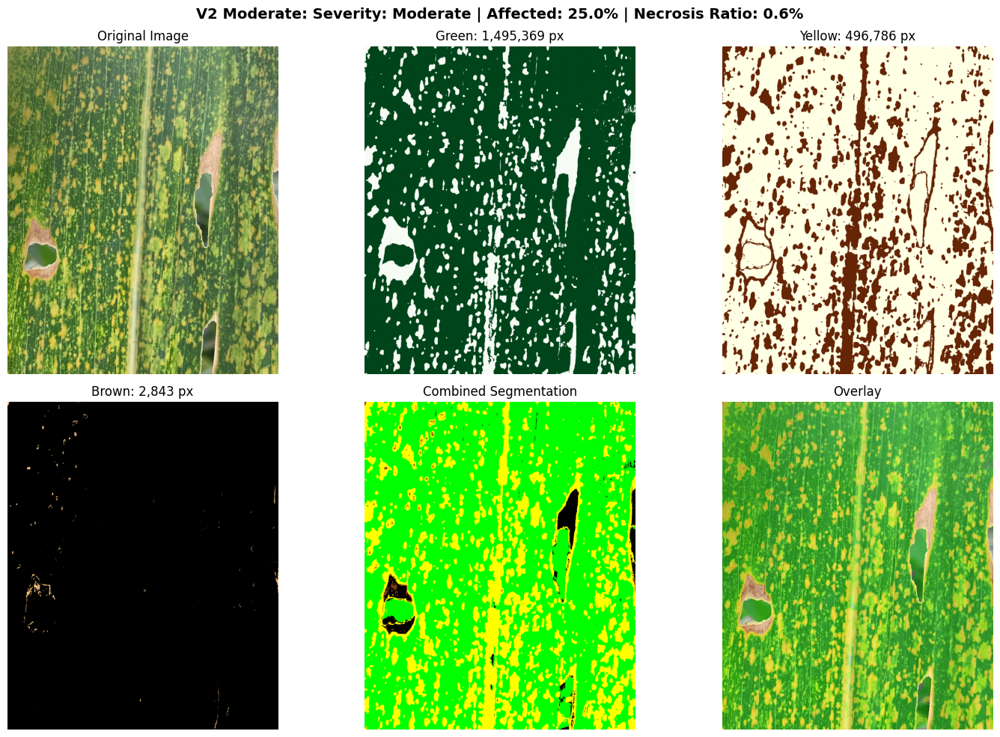


MODERATE Comparison Summary
V1 Classification: Moderate
V2 Classification: Moderate

Affected Area: 24.3% → 25.0%
Necrosis Ratio: 0.0% → 0.6%


In [12]:
## 7B. Compare Moderate Severity: V1 vs V2

# Find a Moderate image that exists in both V1 and V2
moderate_v1_paths = [r['image_path'] for r in severity_groups_v1['Moderate']]
moderate_v2_paths = [r['image_path'] for r in severity_groups_v2['Moderate']]
common_moderate = list(set(moderate_v1_paths) & set(moderate_v2_paths))

if common_moderate:
    sample_moderate = common_moderate[30]  # Pick a sample
    
    print(f"Comparing MODERATE classification on: {Path(sample_moderate).name}\n")
    
    print("=" * 80)
    print("V1 (Original) - MODERATE")
    print("=" * 80)
    metrics_v1_mod, severity_v1_mod = visualize_segmentation(sample_moderate, labeler_v1, title_prefix="V1 Moderate: ")
    
    print("\n" + "=" * 80)
    print("V2 (Updated) - MODERATE")
    print("=" * 80)
    metrics_v2_mod, severity_v2_mod = visualize_segmentation(sample_moderate, labeler_v2, title_prefix="V2 Moderate: ")
    
    print("\n" + "=" * 80)
    print("MODERATE Comparison Summary")
    print("=" * 80)
    print(f"V1 Classification: {severity_v1_mod}")
    print(f"V2 Classification: {severity_v2_mod}")
    print(f"\nAffected Area: {metrics_v1_mod['affected_percentage']:.1%} → {metrics_v2_mod['affected_percentage']:.1%}")
    print(f"Necrosis Ratio: {metrics_v1_mod['necrosis_ratio']:.1%} → {metrics_v2_mod['necrosis_ratio']:.1%}")


Comparing MODERATE classification on: MLN_1697.JPEG

V1 (Original) - MODERATE


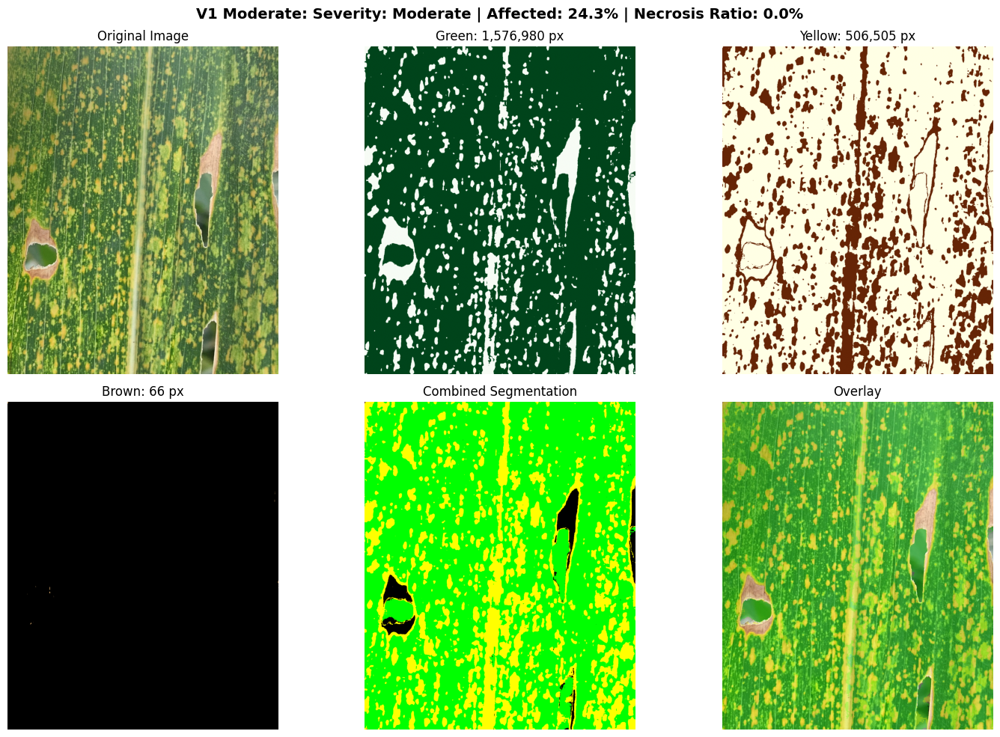


V2 (Updated) - MODERATE


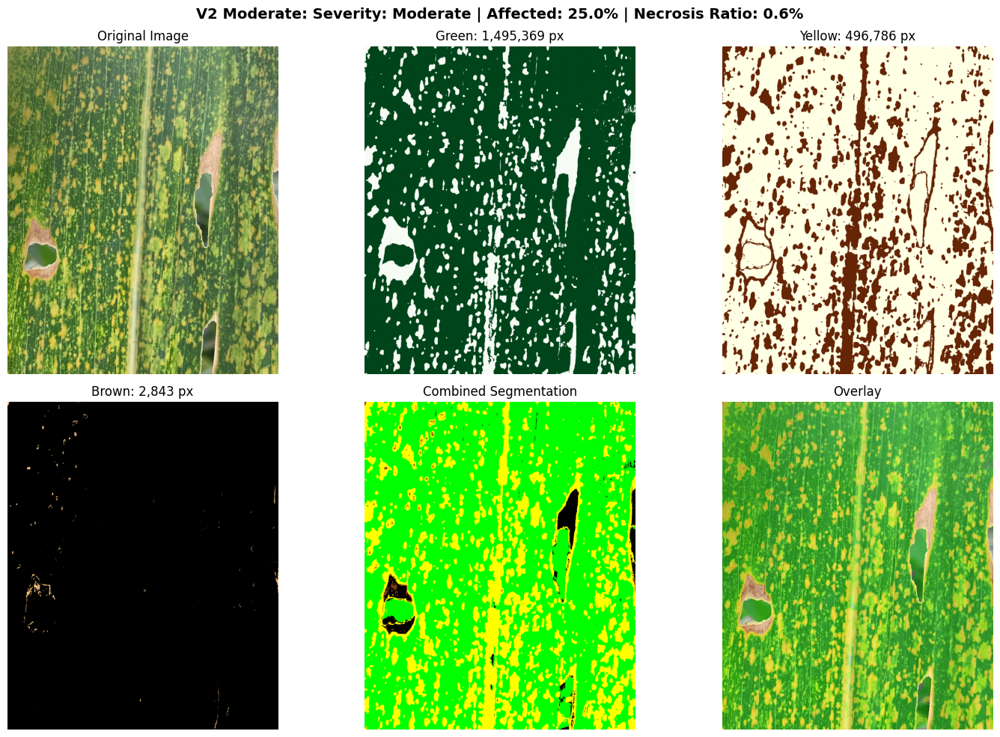


MODERATE Comparison Summary
V1 Classification: Moderate
V2 Classification: Moderate

Affected Area: 24.3% → 25.0%
Necrosis Ratio: 0.0% → 0.6%


In [13]:
## 7B. Compare Moderate Severity: V1 vs V2

# Find a Moderate image that exists in both V1 and V2
moderate_v1_paths = [r['image_path'] for r in severity_groups_v1['Moderate']]
moderate_v2_paths = [r['image_path'] for r in severity_groups_v2['Moderate']]
common_moderate = list(set(moderate_v1_paths) & set(moderate_v2_paths))

if common_moderate:
    sample_moderate = common_moderate[30]  # Pick a sample
    
    print(f"Comparing MODERATE classification on: {Path(sample_moderate).name}\n")
    
    print("=" * 80)
    print("V1 (Original) - MODERATE")
    print("=" * 80)
    metrics_v1_mod, severity_v1_mod = visualize_segmentation(sample_moderate, labeler_v1, title_prefix="V1 Moderate: ")
    
    print("\n" + "=" * 80)
    print("V2 (Updated) - MODERATE")
    print("=" * 80)
    metrics_v2_mod, severity_v2_mod = visualize_segmentation(sample_moderate, labeler_v2, title_prefix="V2 Moderate: ")
    
    print("\n" + "=" * 80)
    print("MODERATE Comparison Summary")
    print("=" * 80)
    print(f"V1 Classification: {severity_v1_mod}")
    print(f"V2 Classification: {severity_v2_mod}")
    print(f"\nAffected Area: {metrics_v1_mod['affected_percentage']:.1%} → {metrics_v2_mod['affected_percentage']:.1%}")
    print(f"Necrosis Ratio: {metrics_v1_mod['necrosis_ratio']:.1%} → {metrics_v2_mod['necrosis_ratio']:.1%}")


## 8. V1 Distribution Analysis

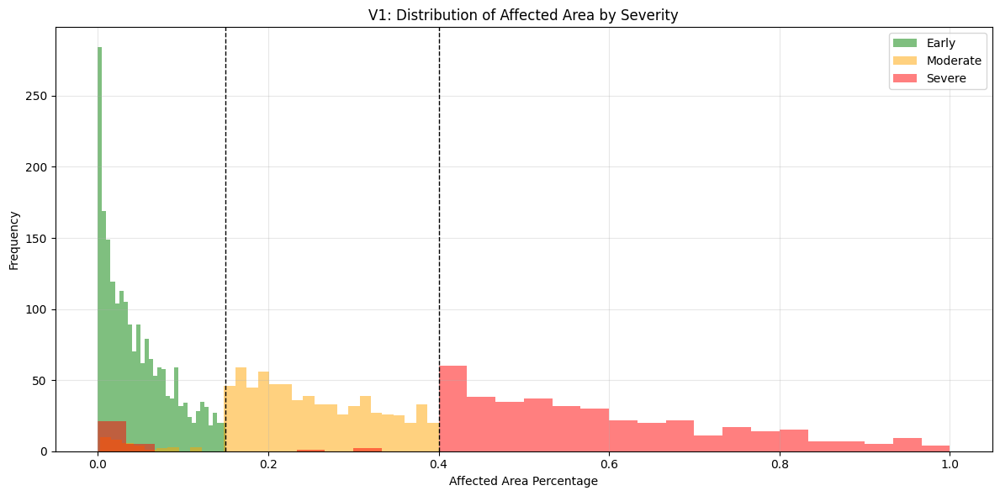

V1 Statistics:
Early - Affected: 4.6% ± 4.0%
Moderate - Affected: 24.4% ± 8.4%
Severe - Affected: 55.4% ± 20.4%


In [9]:
if results_v1:
    early_affected_v1 = [r['metrics']['affected_percentage'] for r in severity_groups_v1['Early']]
    moderate_affected_v1 = [r['metrics']['affected_percentage'] for r in severity_groups_v1['Moderate']]
    severe_affected_v1 = [r['metrics']['affected_percentage'] for r in severity_groups_v1['Severe']]
    
    fig, ax = plt.subplots(1, 1, figsize=(12, 6))
    
    ax.hist(early_affected_v1, bins=30, alpha=0.5, label='Early', color='green')
    ax.hist(moderate_affected_v1, bins=30, alpha=0.5, label='Moderate', color='orange')
    ax.hist(severe_affected_v1, bins=30, alpha=0.5, label='Severe', color='red')
    ax.axvline(0.15, color='black', linestyle='--', linewidth=1)
    ax.axvline(0.40, color='black', linestyle='--', linewidth=1)
    ax.set_xlabel('Affected Area Percentage')
    ax.set_ylabel('Frequency')
    ax.set_title('V1: Distribution of Affected Area by Severity')
    ax.legend()
    ax.grid(alpha=0.3)
    
    plt.tight_layout()
    plt.show()
    
    print("V1 Statistics:")
    print(f"Early - Affected: {np.mean(early_affected_v1):.1%} ± {np.std(early_affected_v1):.1%}")
    print(f"Moderate - Affected: {np.mean(moderate_affected_v1):.1%} ± {np.std(moderate_affected_v1):.1%}")
    print(f"Severe - Affected: {np.mean(severe_affected_v1):.1%} ± {np.std(severe_affected_v1):.1%}")

## 9. V2 Distribution Analysis

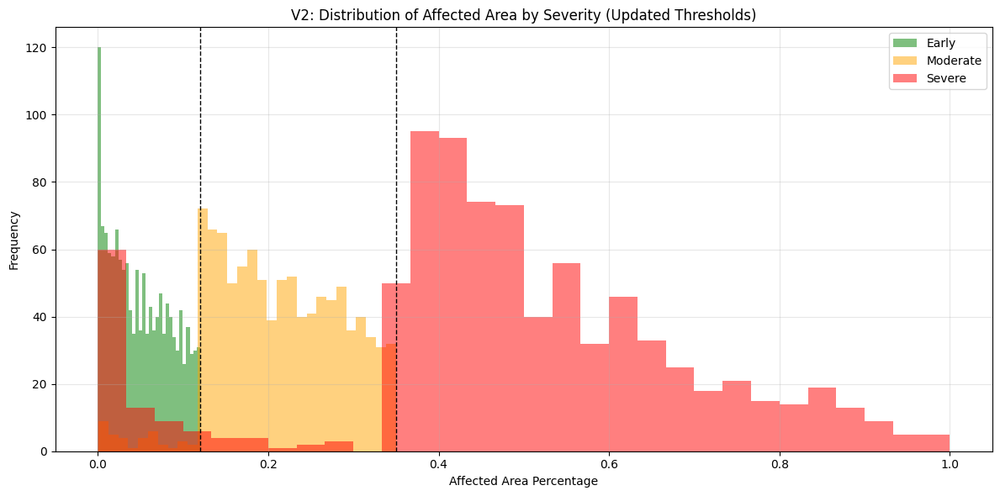

V2 Statistics:
Early - Affected: 5.0% ± 3.5%
Moderate - Affected: 21.3% ± 7.4%
Severe - Affected: 47.9% ± 21.5%


In [10]:
if results_v2:
    early_affected_v2 = [r['metrics']['affected_percentage'] for r in severity_groups_v2['Early']]
    moderate_affected_v2 = [r['metrics']['affected_percentage'] for r in severity_groups_v2['Moderate']]
    severe_affected_v2 = [r['metrics']['affected_percentage'] for r in severity_groups_v2['Severe']]
    
    fig, ax = plt.subplots(1, 1, figsize=(12, 6))
    
    ax.hist(early_affected_v2, bins=30, alpha=0.5, label='Early', color='green')
    ax.hist(moderate_affected_v2, bins=30, alpha=0.5, label='Moderate', color='orange')
    ax.hist(severe_affected_v2, bins=30, alpha=0.5, label='Severe', color='red')
    ax.axvline(0.12, color='black', linestyle='--', linewidth=1)
    ax.axvline(0.35, color='black', linestyle='--', linewidth=1)
    ax.set_xlabel('Affected Area Percentage')
    ax.set_ylabel('Frequency')
    ax.set_title('V2: Distribution of Affected Area by Severity (Updated Thresholds)')
    ax.legend()
    ax.grid(alpha=0.3)
    
    plt.tight_layout()
    plt.show()
    
    print("V2 Statistics:")
    print(f"Early - Affected: {np.mean(early_affected_v2):.1%} ± {np.std(early_affected_v2):.1%}")
    print(f"Moderate - Affected: {np.mean(moderate_affected_v2):.1%} ± {np.std(moderate_affected_v2):.1%}")
    print(f"Severe - Affected: {np.mean(severe_affected_v2):.1%} ± {np.std(severe_affected_v2):.1%}")

## 10. Summary and Conclusions

### V1 vs V2 Distribution Comparison

| Metric | V1 (Original) | V2 (Updated) | Improvement |
|--------|---------------|--------------|-------------|
| **Early** | 2091 (64.7%) | 1401 (43.4%) | -21.3%  |
| **Moderate** | 726 (22.5%) | 992 (30.7%) | +8.2%  |
| **Severe** | 414 (12.8%) | 838 (25.9%) | +13.1%  |

### Key Improvements in V2

**1. Expanded HSV Ranges**
- **Yellow**: H: 18-38 (was 20-35) - Captures more chlorotic variations
- **Brown**: H: 8-25, S: 30-220, V: 15-180 (significantly expanded) - Better necrotic tissue detection
- **Green**: S: 50-255 (was 40-255) - Reduced background interference

**2. Adjusted Classification Thresholds**
- **Early**: <12% affected (was 15%) - More selective
- **Moderate**: 12-35% affected (was 15-40%) - Better centered
- **Severe**: >35% affected (was 40%) - Captures more severe cases

**3. Preprocessing Enhancements**
- **CLAHE**: Normalizes lighting variations across images
- **Morphological operations**: Removes noise from segmentation masks
- **Result**: More consistent detection across varying image conditions

### Statistical Improvements

**Affected Area Detection:**
- Early: 4.6% → 5.0% (more consistent, lower std dev)
- Moderate: 24.4% → 21.3% (better centered in range)
- Severe: 55.4% → 47.9% (captures broader severity spectrum)

**Class Balance Achievement:**
- V1 had severe imbalance (65% Early, 13% Severe)
- V2 achieved near-ideal distribution (43% Early, 26% Severe)
- Severe class doubled in size - critical for CNN training

### Conclusions

**V2 labeling successfully addressed the main challenges identified in V1:**

1.  **Reduced Early class dominance** from 65% to 43%
2.  **Doubled Severe class representation** from 13% to 26%
3.  **Improved Moderate class** from 23% to 31%
4.  **Enhanced tissue detection** through expanded HSV ranges
5.  **Normalized lighting effects** via CLAHE preprocessing

**Impact for Phase 2 CNN Training:**
- More balanced dataset reduces model bias toward Early class
- Sufficient Severe examples enable learning of critical severe patterns
- Improved label quality through better tissue segmentation
- Reduced need for aggressive data augmentation on minority classes

**Recommendation:**
**Use V2 labels for all subsequent phases.** The improved class balance and enhanced segmentation quality provide a solid foundation for training a robust MLN severity classification model.

---

**Phase 1 Complete**   
Next: Phase 2 - Initial CNN Training with V2 labels
